# **Visualization of CNNs: Grad-CAM**
* **Objective**: Convolutional Neural Networks are widely used on computer vision. They are powerful for processing grid-like data. However we hardly know how and why they work, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.
* Computations are light enough to be done on CPU.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

## Download the Model
We provide you with a model `DenseNet-121`, already pretrained on the `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **DenseNet-121**: A deep architecture for image classification (https://arxiv.org/abs/1608.06993)

In [13]:
model = models.densenet121(pretrained=True)
model.eval() # set the model to evaluation mode
pass

In [14]:
model = models.resnext50_32x4d(pretrained=True)
model.eval()
pass

In [4]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

## Input Images
We provide you with 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [5]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object
    
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [6]:
import os
if not os.path.exists("data"):
    os.mkdir("data")
if not os.path.exists("data/TP2_images"):
    os.mkdir("data/TP2_images")
    !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2025/TP2/TP2_images.zip" && unzip TP2_images.zip

dir_path = "data/" 
dataset = preprocess_image(dir_path)

In [7]:
import os
print(os.listdir("data/TP2_images"))

['155881293_721e90b57d.jpg', '158850087_3251644046.jpg', '1624593475_146bf1f7ff.jpg', '181748579_01a4611736.jpg', '2068921624_ef0986de13.jpg', '2637374064_fab14ec0b8.jpg', '2749465889_8e62023674.jpg', '2936812850_23bf0d1cfd.jpg', '3532471222_a6d7e3780e.jpg', '3633913271_ee789a3bc4.jpg', '3633949157_f577605ea9.jpg', '3894967408_706f2135c6.jpg', '4020994958_ee0f171e0d.jpg', '4178031069_53cc807d15.jpg', '430941039_63cdefff92.jpg', '481635090_85a1c668ed.jpg', '4872530262_36641b1698.jpg', '490951559_bf34120cd7.jpg', '5233523570_1e0baebe83.jpg', '5635968516_1975a6f8b9.jpg', '9928031928X1.png', '9928031928X2.png', '9928031928X3.png', '9928031928X4.png']


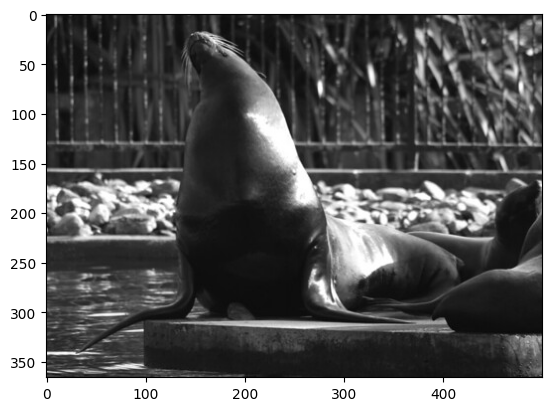

In [9]:
# show the original image 
index = 15  # for comparison later, revert to ``15''
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [10]:
input_image = dataset[index][0].view(1, 3, 224, 224)
# input_image = dataset[index][0].view(1, 3, 224, 224)
# output = densenet121(input_image)
output = model(input_image)
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [150 562 514] ['sea lion', 'fountain', 'cowboy boot']
Raw class scores: [24.37545  11.694006 11.674362]


# Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 

More precisely, you should provide a function: `show_grad_cam(image: torch.tensor) -> None` that displays something like this:

![output_seal.png](output_seal.png)

where the heatmap will be correct (here it is just an example) and the first 3 classes are the top-3 predicted classes and the last is the least probable class according to the model.

* **Comment your code**: Your code should be easy to read and follow. Please comment your code, try to use the NumPy Style Python docstrings for your functions.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (with or without GPU) (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model densenet doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + Your heatmap will have the same size as the feature map. You need to scale up the heatmap to the resized image (224x224, not the original one, before the normalization) for better observation purposes. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link to the paper: [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’  

 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

## Part 1: Grad-CAM implementation

In [ ]:
def show_grad_cam(image: torch.tensor) -> None:
    """
    Displays Grad-CAM for top-3 classes + Lowest class.
    """
    global model, classes
    
    # Grad-CAM computation for a single class
    def compute_single_cam(target_class_idx):
        # use a hook to capture the activations
        activations = []
        gradients = []

        def save_activation(module, input, output):
            activations.append(output)

        def save_gradient(module, input_grad, output_grad):
            gradients.append(output_grad[0])

        # attach to the last layer of the model : it will be layer4.2.conv3 here
        target_layer = model.layer4[-1]
        
        handle_forward = target_layer.register_forward_hook(save_activation)
        handle_backward = target_layer.register_full_backward_hook(save_gradient)

        # forward pass
        model.zero_grad()
        output = model(image)

        # backward pass for target class
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][target_class_idx] = 1
        output.backward(gradient=one_hot_output)

        # get data
        guided_gradients = gradients[0]
        target_activations = activations[0]

        # compute weights and CAM, here we follow what is described in the paper
        weights = torch.mean(guided_gradients, dim=(2, 3), keepdim=True) 
        cam = torch.sum(weights * target_activations, dim=1, keepdim=True) 
        cam = F.relu(cam)  

        # image.shape is [1, C, H, W], we want [H, W]
        cam = F.interpolate(cam, size=image.shape[2:], mode='bilinear', align_corners=False)
        
        # Remove hooks immediately
        handle_forward.remove()
        handle_backward.remove()
        
        # normalize
        cam = cam.detach().cpu().numpy().squeeze()
        cam = cam - cam.min()
        if cam.max() > 0:
            cam = cam / cam.max()
            
        return cam

    
    #model.eval()
    
    # prediction
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
    
    # find top 3 and lowest indices
    _, sorted_indices = torch.sort(output, descending=True)
    top3_indices = sorted_indices[0, :3].tolist()
    lowest_index = sorted_indices[0, -1].item()
    target_indices = top3_indices + [lowest_index]
    labels_titles = ["Top 1", "Top 2", "Top 3", "Lowest"]

    plt.figure(figsize=(20, 5))
    img_display = image.squeeze().permute(1, 2, 0).cpu().numpy()
    img_display = (img_display - img_display.min()) / (img_display.max() - img_display.min())
    
    # plot original
    plt.subplot(1, 5, 1)
    plt.imshow(img_display)
    plt.title("Input Image")
    plt.axis('off')
    
    # loop through targets and Plot CAMs
    for i, class_idx in enumerate(target_indices):
        heatmap = compute_single_cam(class_idx)
        heatmap_colored = plt.cm.jet(heatmap)[..., :3] 
        
        # overlay heatmap on image
        superimposed = 0.6 * img_display + 0.4 * heatmap_colored
        superimposed = np.clip(superimposed, 0, 1)
        
        # get Class Name
        class_name = classes.get(class_idx, str(class_idx))
        if len(class_name) > 20: 
            class_name = class_name[:20] + "..."

        plt.subplot(1, 5, i + 2)
        plt.imshow(superimposed)
        plt.title(f"{labels_titles[i]}\n{class_name}\n({probs[0, class_idx]:.2f})")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

## Part 2: Try it on a few (1 to 3) images and comment

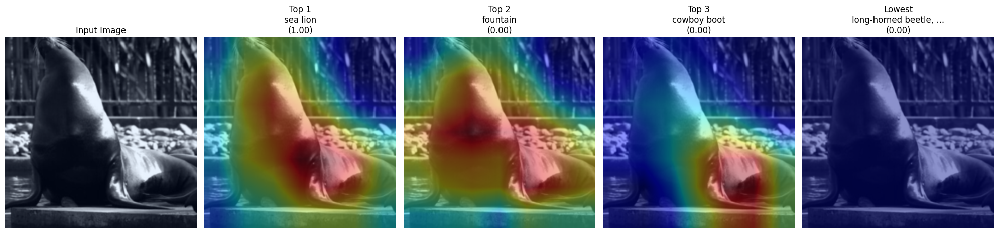

In [18]:
show_grad_cam(image=input_image)

*We can see that the Grad-CAM highlights relevant regions for the top predicted classes as it "colors" the whole sea lion, the less relevant a class is the less it highlights the sea lion (or has a highlighted region in the first place). The lowest predicted class shows no activation at all in this case. This is consistent with the fact that the model is more confident about the top predicted classes than the lowest one.*

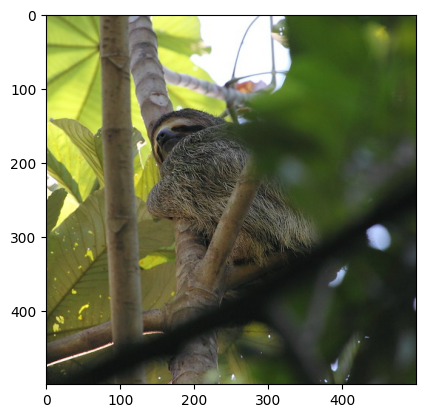

In [19]:
index = 18  # try a different image
input_image_2 = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image_2)
input_image_2 = dataset[index][0].view(1, 3, 224, 224)

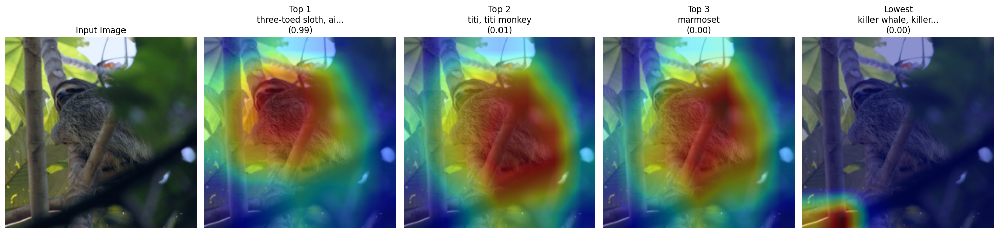

In [20]:
show_grad_cam(image=input_image_2)

*Here things are a bit more subtle, the top high class predicts three-toed sloth (with probability 0.99) and produces a heatmap that focuses on its face in the first place, while the second and third classes (with probabilities 0.01 and 0) produce heatmaps that are more diffuse and less focused on the sloth's face but more on its body and on tree branches. The lowest class has no activation at all on the sloth, rather just a small activaton on bottom left part of the background which is consistent with the fact that the model is very confident about its top prediction and less about the others.*

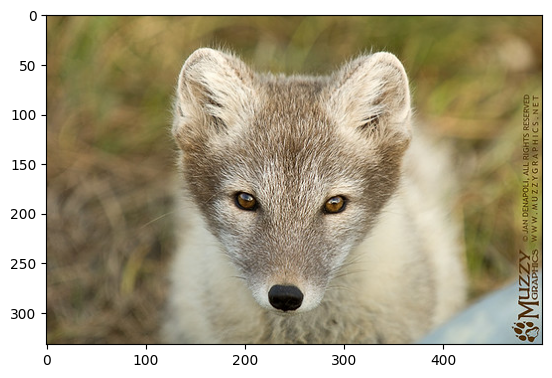

In [21]:
index = 6 # try a different image
input_image_3 = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image_3)
input_image_3 = dataset[index][0].view(1, 3, 224, 224)

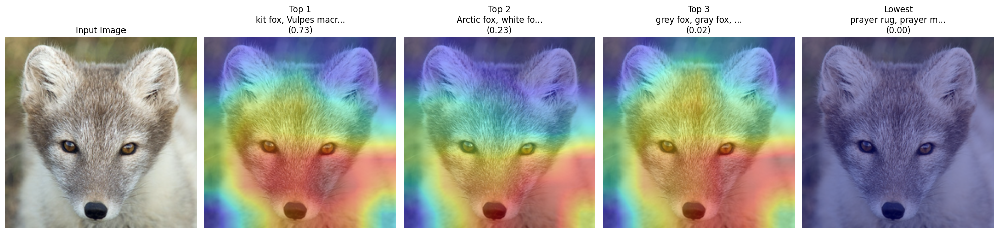

In [22]:
show_grad_cam(image=input_image_3)

*Here once again things are different : at first sight the top predicted class (with probability 0.73) produces a heatmap that is very diffuse and not well focused on the most important part of the image even though the prediction is correct, while the second and third classes (with probabilities 0.23 and 0.02) produce heatmaps that are as diffuse as the one from the top class. This is confusing : even though the top-1 class  is more focused on the bottom part of the kit fox's face, it is less attentive to the top of its head (ears, ...). The less likely class shows no activation at all on the image, just like what we have seen in the sea lion example, which again is consistent.*

## Part 3: Try GradCAM on others convolutional layers, describe and comment the results

In [ ]:
def compare_grad_cam_layers(image: torch.tensor) -> None:
    """
    Displays Grad-CAM for the Top-1 class across different layers of ResNet.
    """
    global model, classes
    
    # define the layers we want to inspect
    # we look at the last block of each stage in ResNet
    target_layers = {
        "Layer 1 (Early)": model.layer1[-1],
        "Layer 2 (Middle)": model.layer2[-1],
        "Layer 3 (Middle)": model.layer3[-1],
        "Layer 4 (Late)": model.layer4[-1]
    }
    
    #model.eval()
    
    # Get Top-1 Prediction
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        score, index = torch.max(output, 1)
        top_class_idx = index.item()
        top_score = probs[0, top_class_idx].item()
        
    class_name = classes.get(top_class_idx, str(top_class_idx))
    print(f"Target Class: {class_name} (Score: {top_score:.2f})")

    # helper to compute CAM for a specific layer, we reuse much of the previous code
    def compute_layer_cam(layer_module):
        activations = []
        gradients = []

        def save_activation(module, input, output):
            activations.append(output)

        def save_gradient(module, input_grad, output_grad):
            gradients.append(output_grad[0])

        # register hooks on the specific layer provided
        handle_forward = layer_module.register_forward_hook(save_activation)
        handle_backward = layer_module.register_full_backward_hook(save_gradient)

        # passes
        model.zero_grad()
        output = model(image)
        
        one_hot = torch.zeros_like(output)
        one_hot[0][top_class_idx] = 1
        output.backward(gradient=one_hot)

        # compute CAM
        guided_gradients = gradients[0]
        target_activations = activations[0]
        
        weights = torch.mean(guided_gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * target_activations, dim=1, keepdim=True)
        cam = F.relu(cam)
        
        # resize to image size
        cam = F.interpolate(cam, size=image.shape[2:], mode='bilinear', align_corners=False)
        
        # cleanup
        handle_forward.remove()
        handle_backward.remove()
        
        # normalize
        cam = cam.detach().cpu().numpy().squeeze()
        cam = cam - cam.min()
        if cam.max() > 0:
            cam = cam / cam.max()
        return cam

    # visualization
    plt.figure(figsize=(20, 5))
    img_display = image.squeeze().permute(1, 2, 0).cpu().numpy()
    img_display = (img_display - img_display.min()) / (img_display.max() - img_display.min())
    plt.subplot(1, 5, 1)
    plt.imshow(img_display)
    plt.title(f"Input\n{class_name}")
    plt.axis('off')
    for i, (layer_name, layer_mod) in enumerate(target_layers.items()):
        heatmap = compute_layer_cam(layer_mod)
        
        heatmap_colored = plt.cm.jet(heatmap)[..., :3]
        superimposed = 0.6 * img_display + 0.4 * heatmap_colored
        superimposed = np.clip(superimposed, 0, 1)
        
        plt.subplot(1, 5, i + 2)
        plt.imshow(superimposed)
        plt.title(layer_name)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

Target Class: sea lion (Score: 1.00)


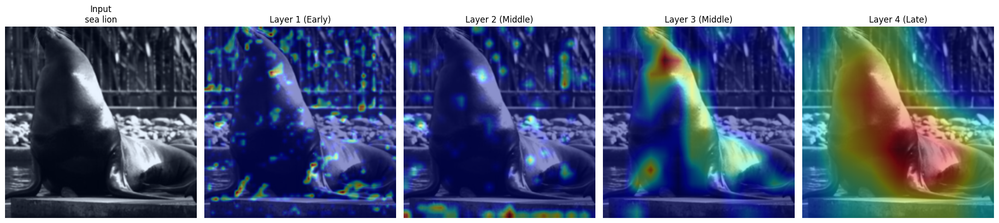

In [24]:
compare_grad_cam_layers(input_image)

*We can see that as we go deeper into the network, the Grad-CAM becomes more qualitative and relevant to the target class. The heatmap from the first convolutional layer is very sparse and not focused on the sea lion at all, while the one from the last convolutional layer is very focused on the sea lion's body. This is consistent with the fact that deeper layers are more specific to the target class and thus produce more relevant heatmaps.*

## Part 4: Try GradCAM on the images `9928031928X{1-4}.png` , describe and comment the results. What can you conclude ?

20
Full path: data/TP2_images\9928031928X1.png


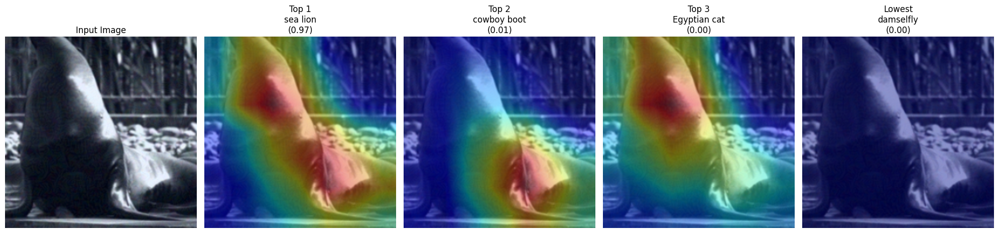

21
Full path: data/TP2_images\9928031928X2.png


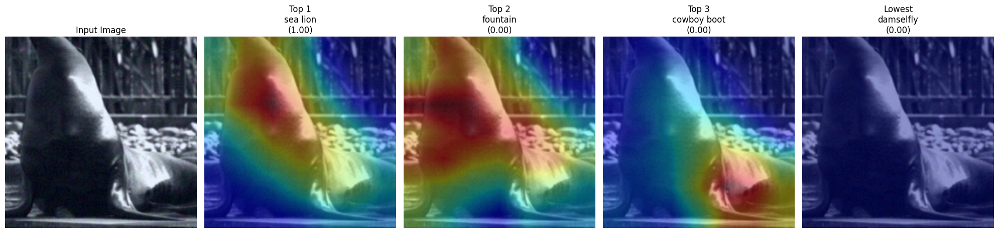

22
Full path: data/TP2_images\9928031928X3.png


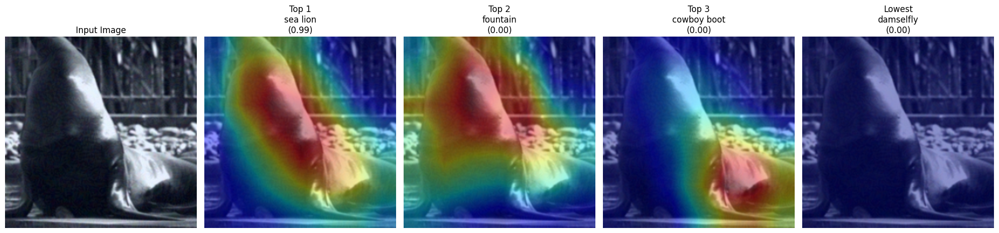

23
Full path: data/TP2_images\9928031928X4.png


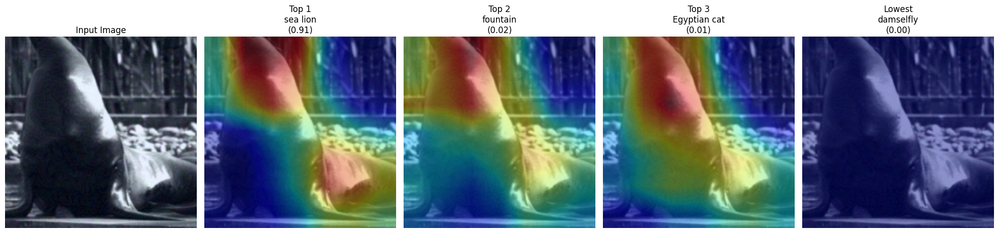

In [25]:
for idx in range(20,24): #images 999928031928X{1-4}.png
    print(idx)
    img = dataset[idx][0].view(1, 3, 224, 224)
    full_path = dataset.imgs[idx][0]
    print("Full path:", full_path)
    show_grad_cam(img)

*The four images look identical to our eyes, but we think that they must have been adversarially modified to fool the network and force it to misclassify them. However the Grad-CAM shows that the network is focusing on different regions and different parts of the sea lion's body for each image, and the network is still able to classify it correctly but with lower confidence for some. The top 2 and 3 classes differ between the four images but sitll have between 0.00-0.02 probability. This confirms that Grad-Cam is robust to adversarial attacks, but not at 100% since the procedure produces different heatmaps for the four semantically identical image.*

## Part 5: What are the principal contributions of GradCAM (the answer is in the paper) ?

*The principal contributions of the paper are:*

* *The authors introduce Grad-CAM, a technique for creating visual explanations for decisions made by any CNN-based network. This method does not require retraining or changing the model architecture and is shown to outperform baselines in localization and faithfulness.*

* *Grad-CAM is applied to various tasks including image classification, image captioning or Visual Question Answering. It provides insights into model failures (showing reasonable explanations for unreasonable predictions) and reveals that CNN+LSTM models can localize discriminative regions without explicit grounding training.*

* *The paper include a proof-of-concept for using interpretable visualizations to uncover biases in datasets, which is vital for fairness and generalization to use neural networks to make decisions.*

* *The paper presents Grad-CAM visualizations specifically for ResNet architectures applied to image classification and VQA.*

* *By combining neuron importance from Grad-CAM with neuron names, the authors are able to generate textual explanations for the model's decisions.*

* *Human studies conducted in the paper show that Guided Grad-CAM explanations are class-discriminative. They help humans establish trust in the model and allow untrained users to distinguish between a "stronger" and a "weaker" network, even when both networks make the exact same prediction.*

## Bonus : What are the main differences between ResNet and ResNeXt ?

*These are two popular convolutional neural network architectures for image processing and as the name suggests, ResNeXt is an extension of ResNet.
ResNeXt introduces a new dimension called "cardinality" (the size of the set of transformations) in addition to depth and width. It uses grouped convolutions (multiple parallel paths inside the convolutional layers) to increase the cardinality, which allows for more complex representations without significantly increasing computational cost. The use of grouped convolutions allows for better representational efficiency at a similar parameter budget compared to ResNet, which relies on standard convolutions. ResNeXt achieves better performances than ResNet on various benchmarks due to its increased representational power for the same computational cost.*